# Librosa Effects 筆記
+ 作者：[owo](https://blog.o-w-o.cc)
+ 日期：2023/03/15
+ 授權：[CC BY-NC-SA 4.0](https://creativecommons.org/licenses/by-nc-sa/4.0/)
+ 參考文檔：[Effects — librosa 0.10.0 documentation](https://librosa.org/doc/0.10.0/effects.html)

## Overview
| Function | Description |
|----------|-------------|
| hpss(y, **kwargs) | Decompose an audio time series into harmonic and percussive components. |
| harmonic(y, **kwargs) | Extract harmonic elements from an audio time-series. |
| percussive(y, **kwargs) | Extract percussive elements from an audio time-series. |
| time_stretch(y, *, rate, **kwargs) | Time-stretch an audio series by a fixed rate. |
| pitch_shift(y, *, sr, n_steps[, ...]) | Shift the pitch of a waveform by n_steps steps. |
| remix(y, intervals, *[, align_zeros]) | Remix an audio signal by re-ordering time intervals. |
| trim(y, *[, top_db, ref, frame_length, ...]) | Trim leading and trailing silence from an audio signal. |
| split(y, *[, top_db, ref, frame_length, ...]) | Split an audio signal into non-silent intervals. |
| preemphasis(y, *[, coef, zi, return_zf]) | Pre-emphasize an audio signal with a first-order differencing filter. |
| deemphasis(y, *[, coef, zi, return_zf]) | De-emphasize an audio signal with the inverse operation of preemphasis(). |

## Harmonic and Percussive Source Separation

In [6]:
# 載入範例音檔
import librosa
y, sr = librosa.load(librosa.ex('choice'), sr=None)
print(f"y.shape: {y.shape}, sr: {sr}")
# 播放音频
import IPython.display as ipd
ipd.Audio(y, rate=sr)

y.shape: (551823,), sr: 22050


In [3]:
# 使用hpss分離音檔
y_harmonic, y_percussive = librosa.effects.hpss(y)
# 播放諧波部分
ipd.Audio(y_harmonic, rate=sr)

In [7]:
# 播放敲擊部分
ipd.Audio(y_percussive, rate=sr)

## Time and frequency

### time_stretch-時間伸縮

In [14]:
# 變快成3倍速，音高不變
y_fast = librosa.effects.time_stretch(y, rate=3.0)
ipd.Audio(y_fast, rate=sr)

In [16]:
# 變慢成0.25倍速度
y_slow = librosa.effects.time_stretch(y, rate=0.25)
ipd.Audio(y_slow, rate=sr)

### pitch_shift-音高變換
+ `bins_per_octave`：預設12，代表一個音階有12個半音
+ `n_steps`：音高變換的半音數

In [10]:
# 提高音高4個半音
y_third = librosa.effects.pitch_shift(y, sr=sr, n_steps=4)
ipd.Audio(y_third, rate=sr)

In [17]:
# 降低音高3個半音，但一共有24個半音為一個八度
y_three_qt = librosa.effects.pitch_shift(y, sr=sr, n_steps=3,
                                         bins_per_octave=24)
ipd.Audio(y_three_qt, rate=sr)

## Miscellaneous-其他各種效果

### remix-混音
+ 指定時間區間，將音訊重新排列

In [18]:
_, beat_frames = librosa.beat.beat_track(y=y, sr=sr, hop_length=512) #  
beat_samples = librosa.frames_to_samples(beat_frames)
intervals = librosa.util.frame(beat_samples, frame_length=2,
                               hop_length=1).T
y_remix = librosa.effects.remix(y, intervals[::-1])
ipd.Audio(y_remix, rate=sr)

In [29]:
# 第一步：追蹤節拍
beat_samples

array([  1536,  10752,  20480,  30208,  39936,  49152,  59392,  69120,
        78848,  88576,  98304, 108032, 117760, 127488, 137216, 146944,
       156672, 166400, 176128, 185856, 195584, 205312, 215040, 224768,
       234496, 243712, 253440, 263680, 273408, 283136, 292864, 302592,
       312320, 322048, 331264, 341504, 351232, 360960, 370688, 380416,
       390144, 399360, 409088, 419328, 429056, 438784, 448512, 458240,
       467968, 477696, 486912, 497152, 506880, 516096])

In [30]:
# 第二步：將節拍轉換成區間
# 可以發現區間之間是頭尾相接的
intervals[:10] # 顯示前10個區間看看

array([[ 1536, 10752],
       [10752, 20480],
       [20480, 30208],
       [30208, 39936],
       [39936, 49152],
       [49152, 59392],
       [59392, 69120],
       [69120, 78848],
       [78848, 88576],
       [88576, 98304]])

In [32]:
# 第三步：將區間反轉
intervals[::-1][:10] # 取前10個看看

array([[506880, 516096],
       [497152, 506880],
       [486912, 497152],
       [477696, 486912],
       [467968, 477696],
       [458240, 467968],
       [448512, 458240],
       [438784, 448512],
       [429056, 438784],
       [419328, 429056]])

### trim-去除開頭和結尾的靜音

In [38]:
yt, index = librosa.effects.trim(y)
print(librosa.get_duration(y), librosa.get_duration(yt))
print(y.shape, yt.shape)

25.025986394557822 25.007891156462584
(551823,) (551424,)


C:\Users\O-W-O\AppData\Local\Temp\ipykernel_29760\1102731707.py:2: FutureWarning: Pass y=[ 1.0289368e-05  1.9799588e-06  2.5269967e-06 ...  4.2585348e-06
 -7.8615221e-06 -1.8652894e-05] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  print(librosa.get_duration(y), librosa.get_duration(yt))
C:\Users\O-W-O\AppData\Local\Temp\ipykernel_29760\1102731707.py:2: FutureWarning: Pass y=[ 1.0289368e-05  1.9799588e-06  2.5269967e-06 ...  1.3430978e-05
  2.6416183e-05 -7.7727163e-06] as keyword args. From version 0.10 passing these as positional arguments will result in an error
  print(librosa.get_duration(y), librosa.get_duration(yt))


### split-將音訊分割成非靜音區間

In [35]:
split_intervals = librosa.effects.split(y, top_db=30)
print(split_intervals.shape)
split_intervals[:10]

(34, 2)


array([[     0,   8192],
       [ 12800,  26624],
       [ 28672,  31744],
       [ 33792,  36352],
       [ 38400,  41984],
       [ 43520,  83968],
       [ 87552, 103936],
       [111104, 114688],
       [116224, 119808],
       [120832, 144896]])

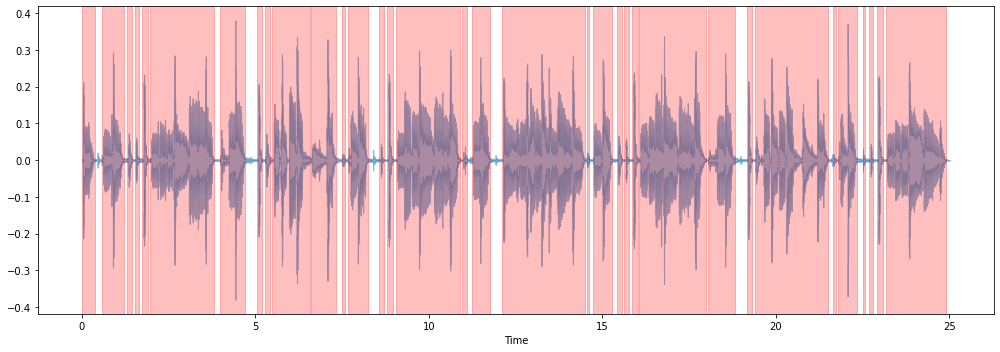

In [37]:
# 繪製原始音檔的波形圖
# 把所有split_intervals的區間都畫出來(用帶透明度的區間表示)
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, alpha=0.5)
for f0, f1 in split_intervals:
    plt.axvspan(f0 / sr, f1 / sr, alpha=0.25, color='r')
plt.tight_layout()

### preemphasis-預強調
$$y[n] -> y[n] - coef * y[n-1]$$
+ `coef`：預設0.97

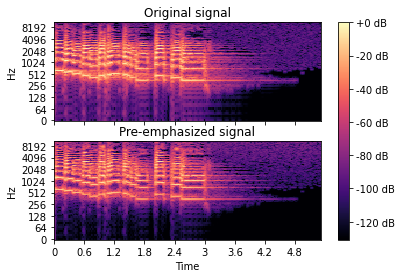

In [39]:
# 做預強調
import numpy as np
y2, sr = librosa.load(librosa.ex('trumpet'))
y_filt = librosa.effects.preemphasis(y2)
# and plot the results for comparison
S_orig = librosa.amplitude_to_db(np.abs(librosa.stft(y2)), ref=np.max, top_db=None)
S_preemph = librosa.amplitude_to_db(np.abs(librosa.stft(y_filt)), ref=np.max, top_db=None)
fig, ax = plt.subplots(nrows=2, sharex=True, sharey=True)
librosa.display.specshow(S_orig, y_axis='log', x_axis='time', ax=ax[0])
ax[0].set(title='Original signal')
ax[0].label_outer()
img = librosa.display.specshow(S_preemph, y_axis='log', x_axis='time', ax=ax[1])
ax[1].set(title='Pre-emphasized signal')
fig.colorbar(img, ax=ax, format="%+2.f dB")

可以發現有做預強調的音訊，高頻部分會變得比較清楚，且低頻部分會變得比較弱

In [41]:
y_filt_1, zf = librosa.effects.preemphasis(y2[:1000], return_zf=True)
y_filt_2, zf = librosa.effects.preemphasis(y2[1000:], zi=zf, return_zf=True)
np.allclose(y_filt, np.concatenate([y_filt_1, y_filt_2])) # 用 np.allclose 檢查結果是否相同(十分接近)


True

### deemphasis-去除預強調
+ emphasis()的反向操作

In [46]:
y2, sr = librosa.load(librosa.ex('trumpet'))
y_filt = librosa.effects.preemphasis(y2)
y_deemph = librosa.effects.deemphasis(y_filt)
np.allclose(y2, y_deemph)

False

In [45]:
# 檢查y2和y_deemph不相同的地方
np.where(y2 != y_deemph)

(array([     0,      1,      2, ..., 117598, 117599, 117600], dtype=int64),)

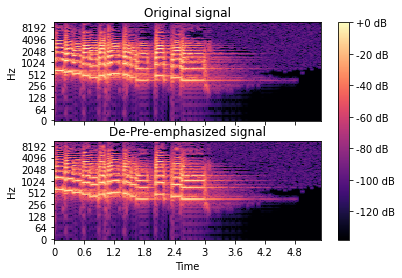

In [47]:
# 檢查頻譜圖
S_orig = librosa.amplitude_to_db(np.abs(librosa.stft(y2)), ref=np.max, top_db=None)
S_preemph = librosa.amplitude_to_db(np.abs(librosa.stft(y_deemph)), ref=np.max, top_db=None)
fig, ax = plt.subplots(nrows=2, sharex=True, sharey=True)
librosa.display.specshow(S_orig, y_axis='log', x_axis='time', ax=ax[0])
ax[0].set(title='Original signal')
ax[0].label_outer()
img = librosa.display.specshow(S_preemph, y_axis='log', x_axis='time', ax=ax[1])
ax[1].set(title='De-Pre-emphasized signal')
fig.colorbar(img, ax=ax, format="%+2.f dB")

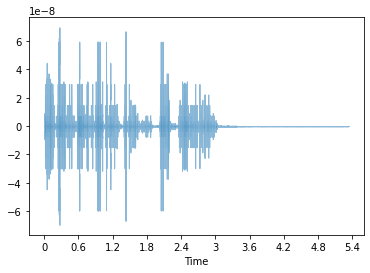

In [48]:
# 檢查時域圖
librosa.display.waveshow(y2-y_deemph, sr=sr, alpha=0.5)

In [50]:
# 檢查最大差異
np.max(np.abs(y2-y_deemph))

6.984919e-08

看起來應該是因為`np.allclose()`預設容許為`1e-08`

In [51]:
y2, sr = librosa.load(librosa.ex('trumpet'))
y_filt = librosa.effects.preemphasis(y2)
y_deemph = librosa.effects.deemphasis(y_filt)
np.allclose(y2, y_deemph, atol=1e-07)

True